# OLKAVS EDA


In [1]:
import pandas as pd
import matplotlib.pyplot as plt



## Metadata

In [2]:
# CSV 파일 경로
file_path = f'/home/data/data_OLKAVS/OLKAVS/data/annotation.csv'  # 파일명에 맞게 수정하세요.

# CSV 파일 읽기
data = pd.read_csv(file_path)

# 상위 5개 행을 인덱스 없이 출력
top_5_rows = data.head().to_string(index=False)
print(top_5_rows)


      folder_name file_number gender  age  noise topic                                 script
lip_J_1_F_01_C281     001-001      F    1      1 daily                  아빠 저도 냉면 한 그릇 시켜 주세요.
lip_J_1_F_01_C281     001-002      F    1      1 daily                         엄마 나 피자 먹고 싶어.
lip_J_1_F_01_C281     001-003      F    1      1 daily                        이모 저 당근 못 먹겠어요.
lip_J_1_F_01_C281     001-004      F    1      1 daily              저는 엄마가 구워주는 고등어가 제일 맛있어요.
lip_J_1_F_01_C281     001-005      F    1      1 daily 저는 어려도 설러탕 설X 설렁탕 혼자 한 그릇 다 먹을 수 있다고요.


### 전체 인원수


In [3]:
people = data.copy()

people.drop_duplicates(subset='folder_name', keep='first', inplace=True)
print(people.shape[0])
print(people)

1000
              folder_name file_number gender  age  noise            topic  \
0       lip_J_1_F_01_C281     001-001      F    1      1            daily   
490     lip_J_1_F_02_C002     001-001      F    2      1         job/work   
1062    lip_J_1_F_02_C004     001-001      F    2      1         job/work   
1576    lip_J_1_F_02_C017     001-001      F    2      1  human relations   
2065    lip_J_1_F_02_C025     001-001      F    2      1      health/diet   
...                   ...         ...    ...  ...    ...              ...   
430095  lip_K_5_M_05_C956     001-001      M    5      5     social issue   
430339  lip_K_5_M_06_C530     001-001      M    6      5      art/culture   
430860  lip_K_5_M_06_C637     001-001      M    6      5            daily   
431311  lip_K_5_M_06_C840     001-001      M    6      5              pet   
431609  lip_K_5_M_06_C920     001-001      M    6      5            daily   

                                               script  
0             

### 성비

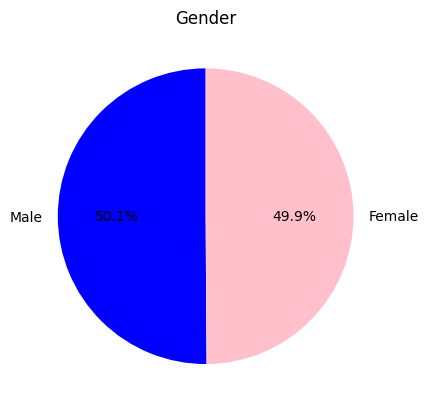

gender
Male      501
Female    499
Name: count, dtype: int64


In [4]:
# 'F'와 'M'의 개수 카운트
count_fm = people['gender'].value_counts()
# 인덱스 이름 변경 ('F' -> 'Female', 'M' -> 'Male')
count_fm.index = count_fm.index.map({'M': 'Male','F': 'Female'})

# 원 그래프 생성
plt.pie(count_fm, labels=count_fm.index, autopct='%1.1f%%', colors=['blue', 'pink'], startangle=90)

plt.title('Gender')  # 그래프 제목
plt.show()

print(count_fm)

### 연령대
10대 에서 60대 까지 구성

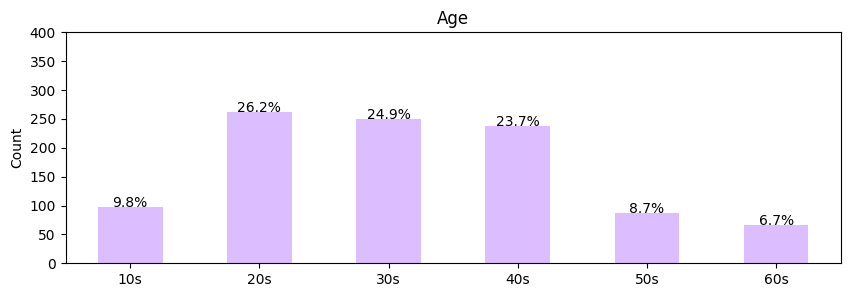

In [5]:
# values 딕셔너리 정의
values = {1: '10s', 2: '20s', 3: '30s', 4: '40s', 5: '50s', 6: '60s'}

# 데이터 카운트 및 정렬
count_fm = people['age'].value_counts()
count_fm.index = count_fm.index.map(values)
count_fm = count_fm.sort_index()


# 바 그래프 생성
count_fm.plot(kind='bar',figsize=(10,3),color="#DCBDFF")

# 각 막대 안에 텍스트 넣기
for i, v in enumerate(count_fm):
    plt.text(i, v + 0.1, f"{v/sum(count_fm)*100:.1f}%", ha='center')

plt.title('Age')  # 그래프 제목
plt.xticks(rotation=0)  # x축 레이블의 방향을 수평으로 설정
plt.xlabel('')  # x축 레이블 제거
plt.ylabel('Count')  # y축 레이블 설정
plt.ylim(0, 400)  # y축 범위 설정

plt.show()

### 소음 환경
총 6가지의 소음환경 

(소음 없음, 생활 소음, 교통 소음, 산업 소음, 자연 소음, 기타 소음)

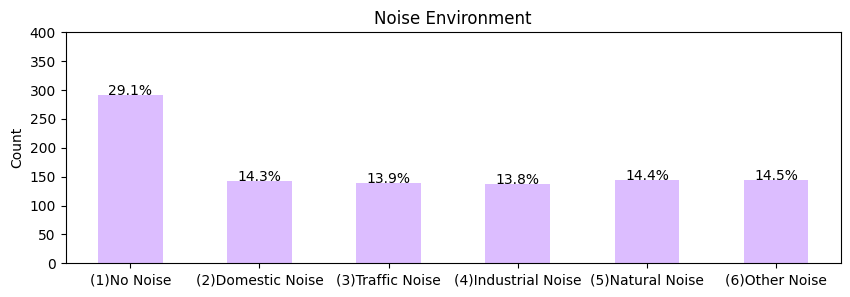

In [6]:
# values 딕셔너리 정의
values = {1: '(1)No Noise', 2: '(2)Domestic Noise', 3: '(3)Traffic Noise', 4: '(4)Industrial Noise', 5: '(5)Natural Noise', 6: '(6)Other Noise'}

# 데이터 카운트 및 정렬
count_fm = people['noise'].value_counts()
count_fm.index = count_fm.index.map(values)
count_fm = count_fm.sort_index()



# 바 그래프 생성
count_fm.plot(kind='bar',figsize=(10,3), color= "#DCBDFF")

# 각 막대 안에 텍스트 넣기
for i, v in enumerate(count_fm):
    plt.text(i, v + 0.1, f"{v/sum(count_fm)*100:.1f}%", ha='center')

plt.title('Noise Environment')  # 그래프 제목
plt.xticks(rotation=0)  # x축 레이블의 방향을 수평으로 설정
plt.xlabel('')  # x축 레이블 제거
plt.ylabel('Count')  # y축 레이블 설정
plt.ylim(0, 400)  # y축 범위 설정

plt.show()


### 발화 문장 주제
총 14 종류의 발화 주제
(휴가, 교통수단, 사회/시사, 건강/다이어트, 문화/예술, 스포츠/레저, 음식, 인간관계, 경제/재테크, 진학/학교, 반려동물, 일/직장/직업, 일상생활, 관혼상제)

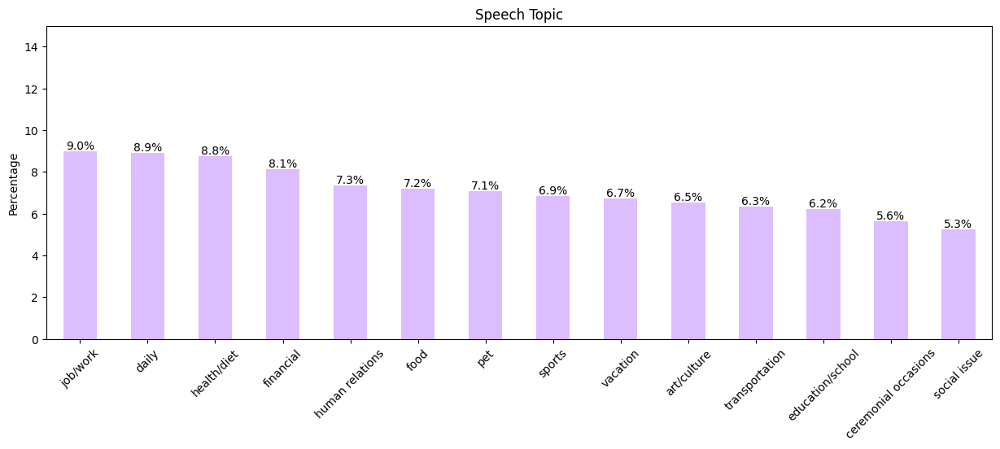

In [7]:
# 데이터 카운트 및 정렬
count_fm = data['topic'].value_counts()

# 백분율 계산
percentages = count_fm / count_fm.sum() * 100

# 바 그래프 생성
ax = percentages.plot(kind='bar', figsize=(15, 5), color= "#DCBDFF")

# 각 막대 안에 텍스트 넣기
for i, v in enumerate(percentages):
    ax.text(i, v + 0.1, f"{v:.1f}%", ha='center')

plt.title('Speech Topic',)  # 그래프 제목
plt.xticks(rotation=0)  # x축 레이블의 방향을 수평으로 설정
plt.xlabel('')  # x축 레이블 제거
plt.ylabel('Percentage')  # y축 레이블을 'Percentage'로 설정
plt.ylim(0,15)
plt.xticks(rotation=45)  # x축 레이블의 방향을 45도로 설정

plt.show()


## Voice data (All Noise Environments)

In [8]:
import numpy as np
import librosa
import warnings
warnings.filterwarnings('ignore')
import os

In [9]:
root_dir = f'/home/data/data_OLKAVS/OLKAVS/data'
folder_list = [folder for folder in os.listdir(root_dir) if os.path.isdir(os.path.join(root_dir, folder))]


print(len(folder_list))

999


In [10]:
def calculate_average_wav(wav_root_path, wav_files):
    """
    여러 개의 WAV 파일을 로드하여 평균 음성 데이터를 계산합니다.
    
    :param wav_root_path: WAV 파일들의 root 경로
    :param wav_files: WAV 파일들의 상대 경로 리스트
    :return: 평균 음성 데이터, 샘플링 레이트
    """
    sr = 22050
    # 각 WAV 파일들의 전체 경로 구성
    full_wav_paths = [os.path.join(wav_root_path, file) for file in wav_files]
    
    # 각 WAV 파일들의 데이터와 샘플링 레이트를 리스트에 저장
    wavs = []
    for wav_file in full_wav_paths:
        
        wav, wav_sr = librosa.load(wav_file, sr=None)
        if wav_sr != sr:
            wav = librosa.resample(wav, orig_sr=wav_sr, target_sr=sr)

        if len(wav) >= 3*sr:  # 오디오가 3초 이상인지 확인
            wavs.append(wav[:3*sr])
    
    # 각 WAV 파일들의 데이터를 평균하여 새로운 음성 데이터 생성
    avg_wav = np.mean(wavs, axis=0)
    return avg_wav

def name_classification(name):
    name_list = name.split("_")
    noise = int(name_list[2])-1
    gender = 0 if name_list[3] is 'M' else 1
    age = int(name_list[4])-1
    return noise, gender, age


In [11]:
# 성별, 나이, 소음환경 별 wavfile 분류
avg_wavs_3d_list = [[[None for _ in range(2)] for _ in range(6)] for _ in range(6)]

gender = ['Male','Female']
age = ['10s','20s','30s','40s','50s','60s']
noise = ['No Noise', 'Domestic Noise', 'Traffic Noise', 'Industrial Noise', 'Natural Noise', 'Other Noise']

In [ ]:
for i in folder_list:
    audio_path = os.path.join(root_dir,i,'audio')
    try:
        file_list = os.listdir(audio_path)
        avg_wav = calculate_average_wav(audio_path, file_list)
        n, g, a = name_classification(i)
    except FileNotFoundError:
        # 폴더가 존재하지 않는 경우에 대한 처리 (예: 로깅)
        print(f"폴더 '{i}'의 오디오 파일이 존재하지 않습니다. 넘어갑니다.")
        continue
    except NotADirectoryError:
        continue

    if avg_wavs_3d_list[n][a][g] is not None:
        avg_wavs_3d_list[n][a][g] = (avg_wavs_3d_list[n][a][g] + avg_wav) / 2.0
    else:
        avg_wavs_3d_list[n][a][g] = avg_wav
    
    

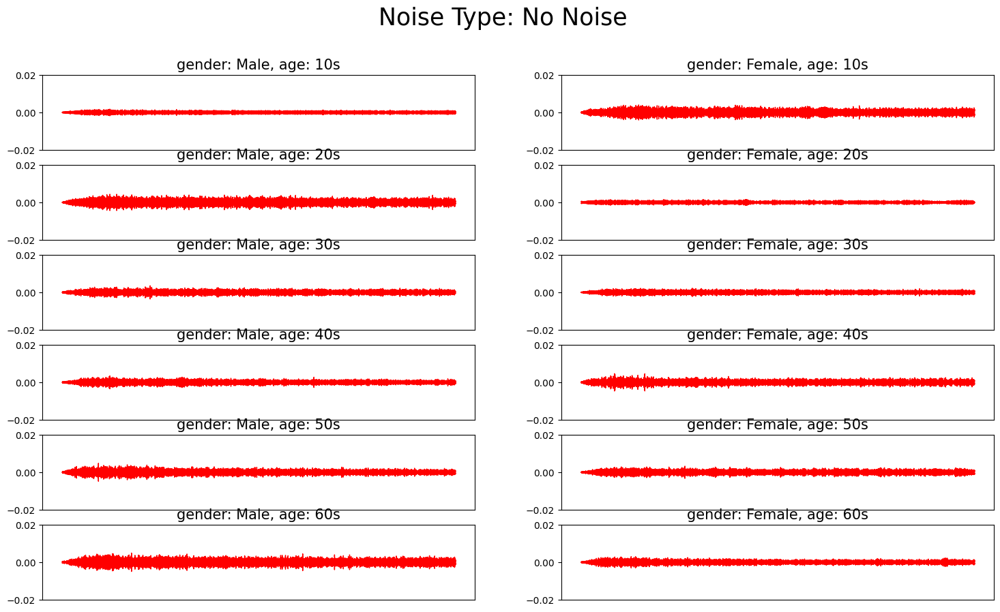

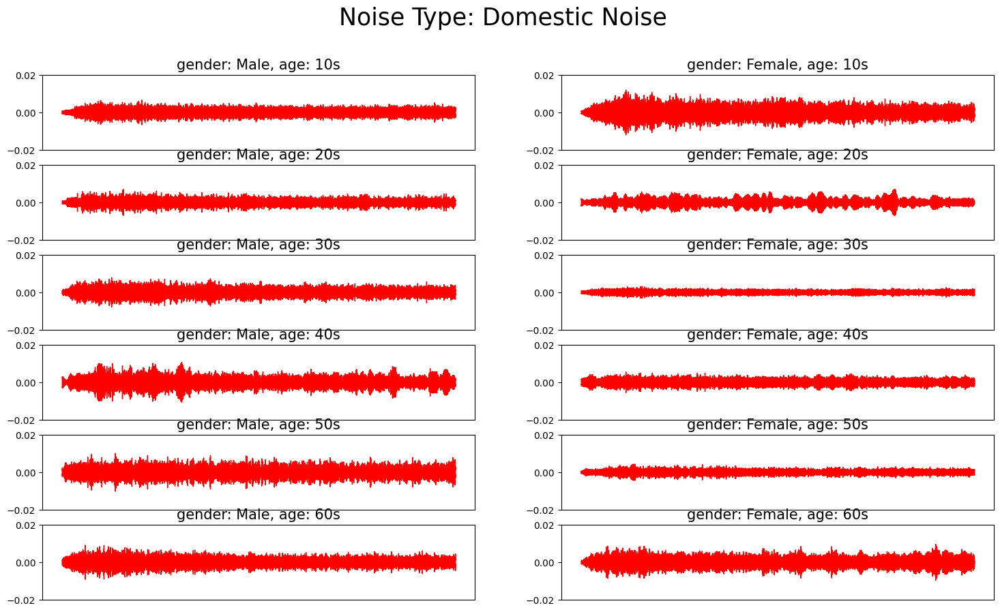

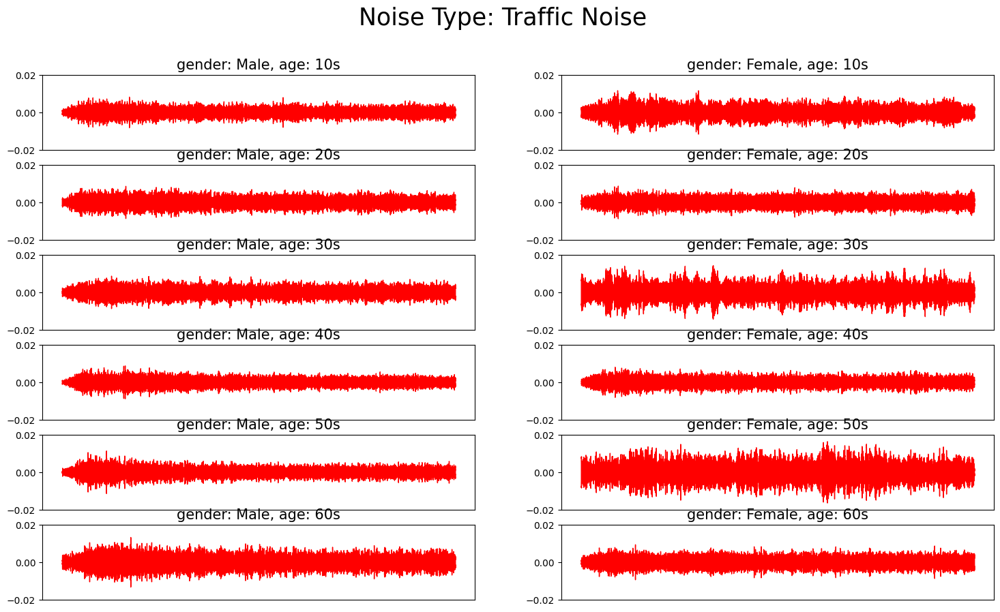

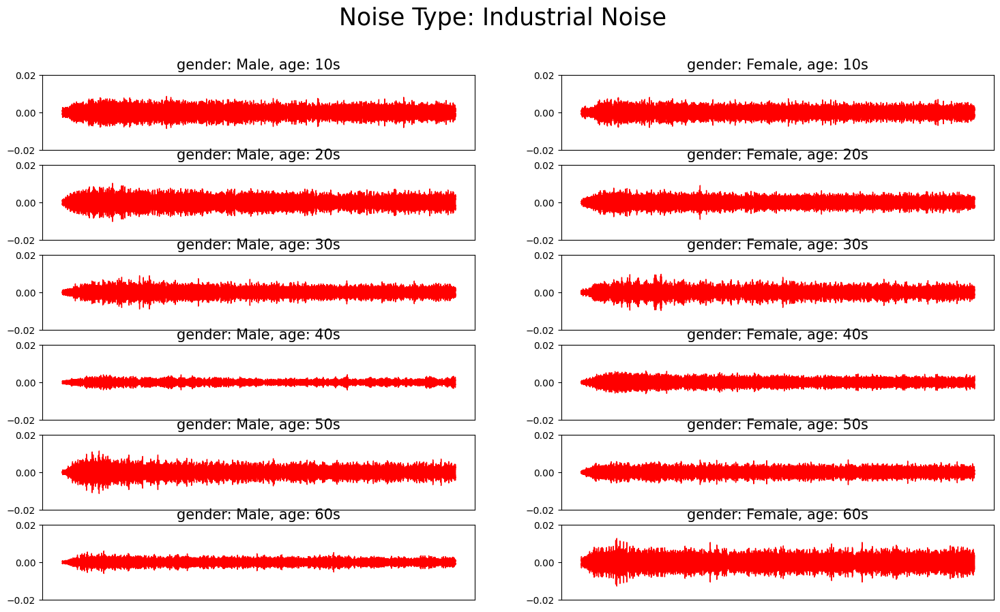

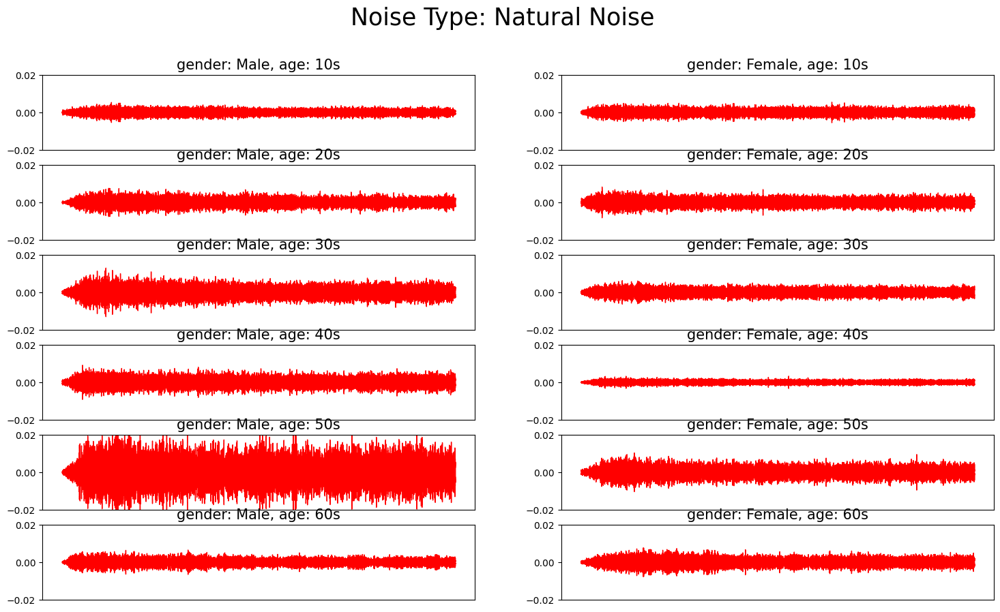

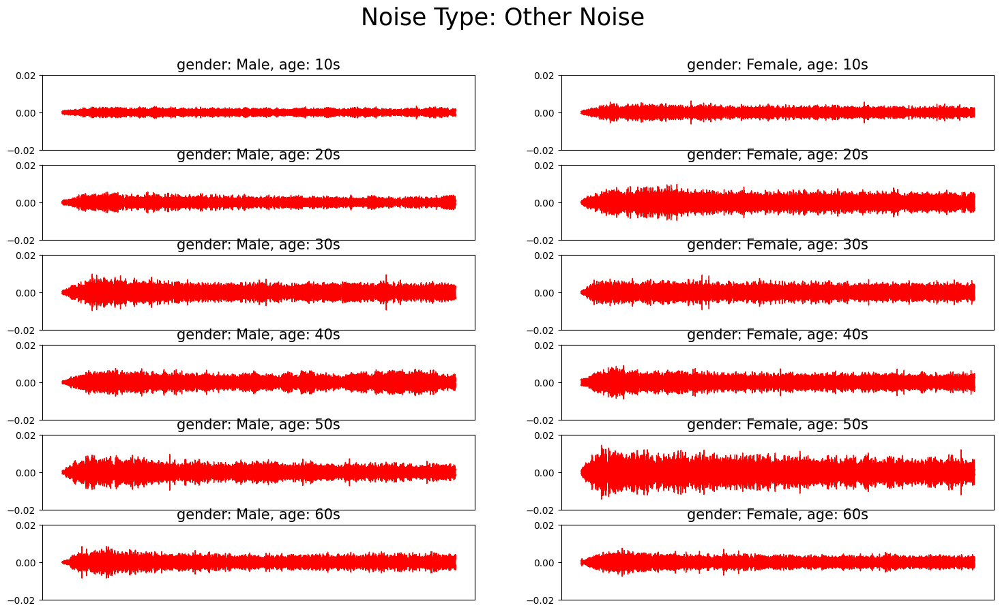

In [ ]:
# avg_wavs_3d_list 순회
sr = 22050
for n in range(len(avg_wavs_3d_list)):
    plt.figure(figsize=(18,10))
    plt.suptitle(f"Noise Type: {noise[n]}",fontsize=25)

    for a in range(len(avg_wavs_3d_list[n])):
        for g in range(len(avg_wavs_3d_list[n][a])):
            avg_wav = avg_wavs_3d_list[n][a][g]
            # None인 경우 처리
            if avg_wav is None:
                continue
            plt.subplot(6,2,a*2+g+1)
            librosa.display.waveshow(avg_wav, sr=sr, color='r')
            plt.gca().set_title(f'gender: {gender[g]}, age: {age[a]}',fontsize=15)
            plt.gca().get_xaxis().set_visible(False)
            plt.gca().set_ylim([-0.02, 0.02])  # y축 범위 설정
    plt.show()

### Wave + Spectral Centroid

### Mel Spectrogram

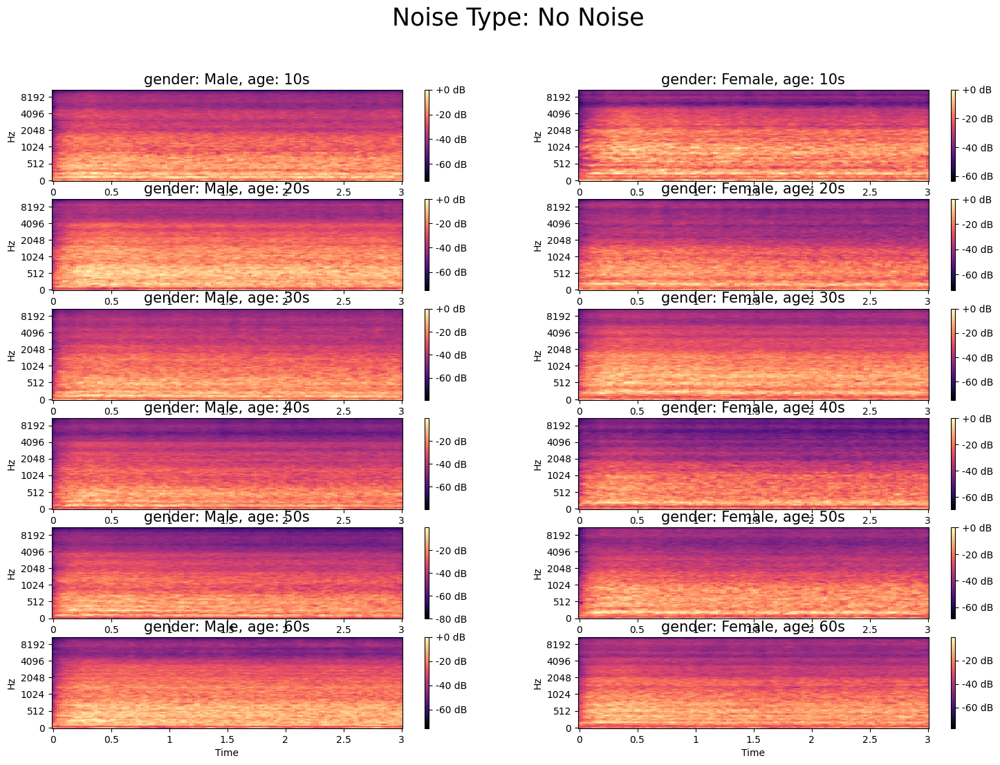

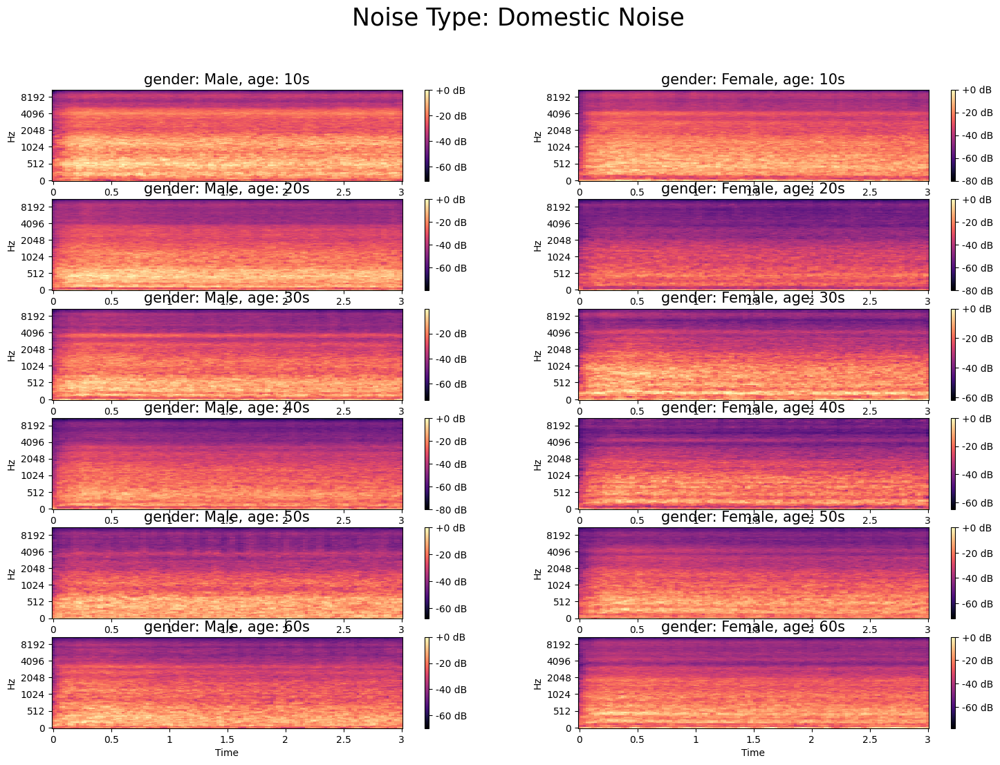

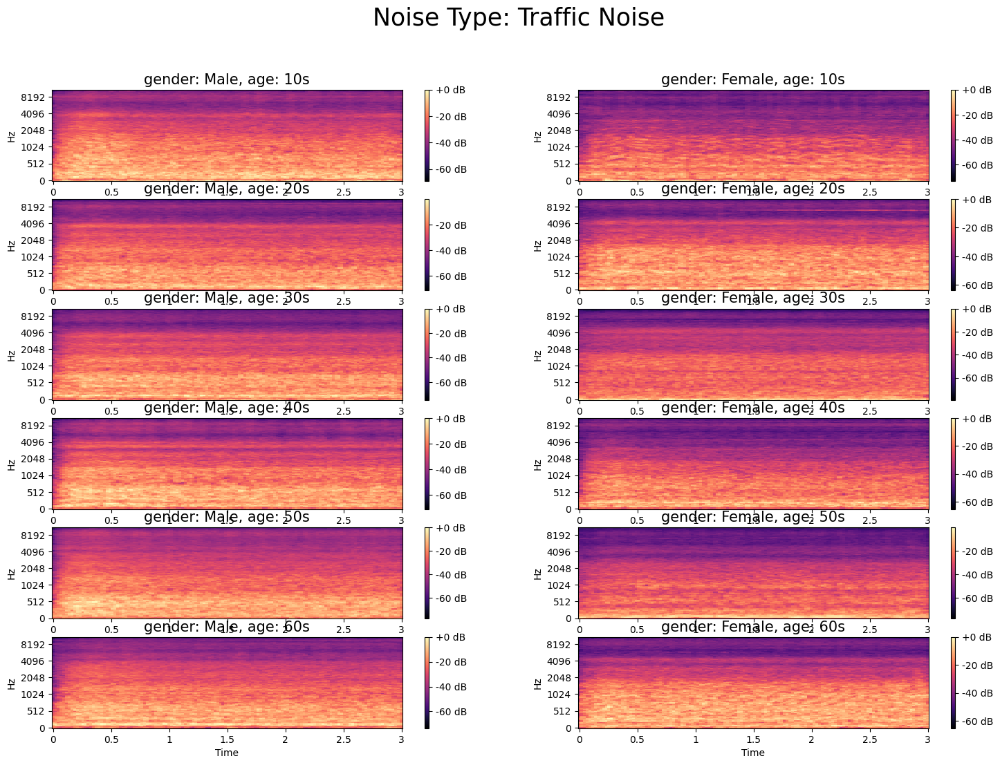

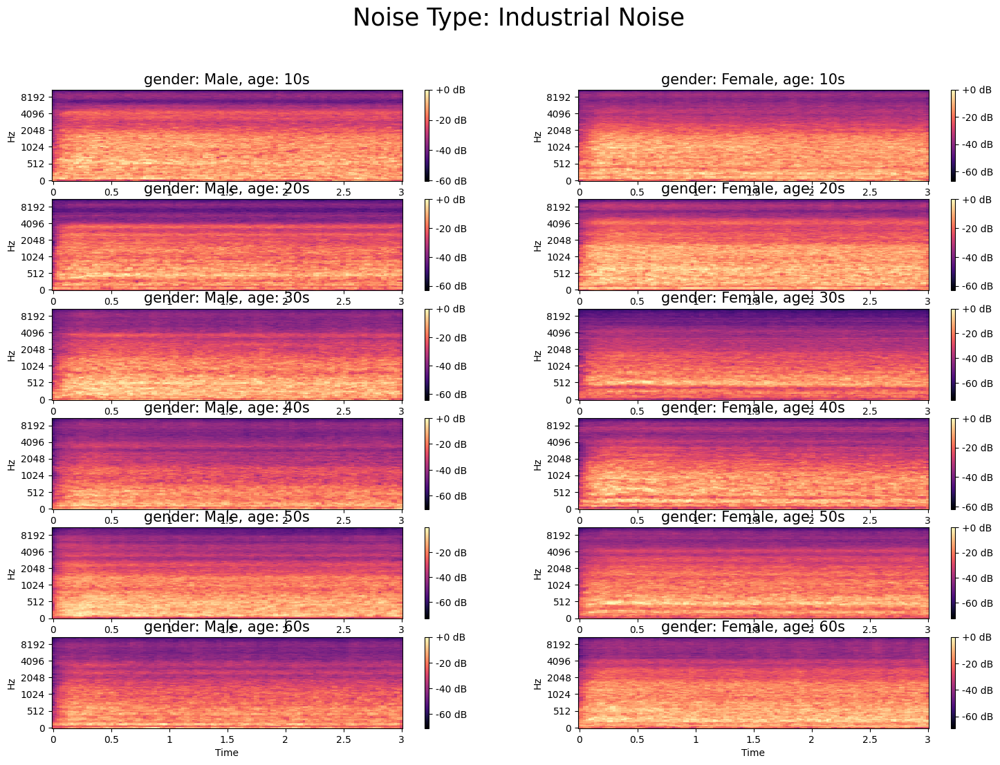

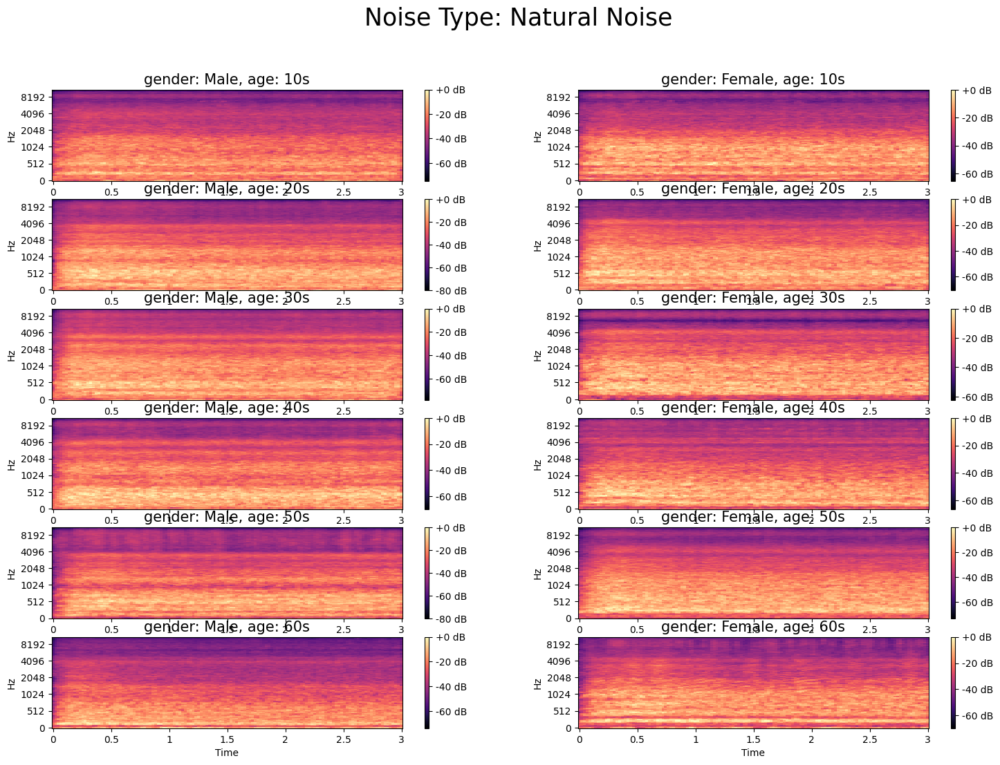

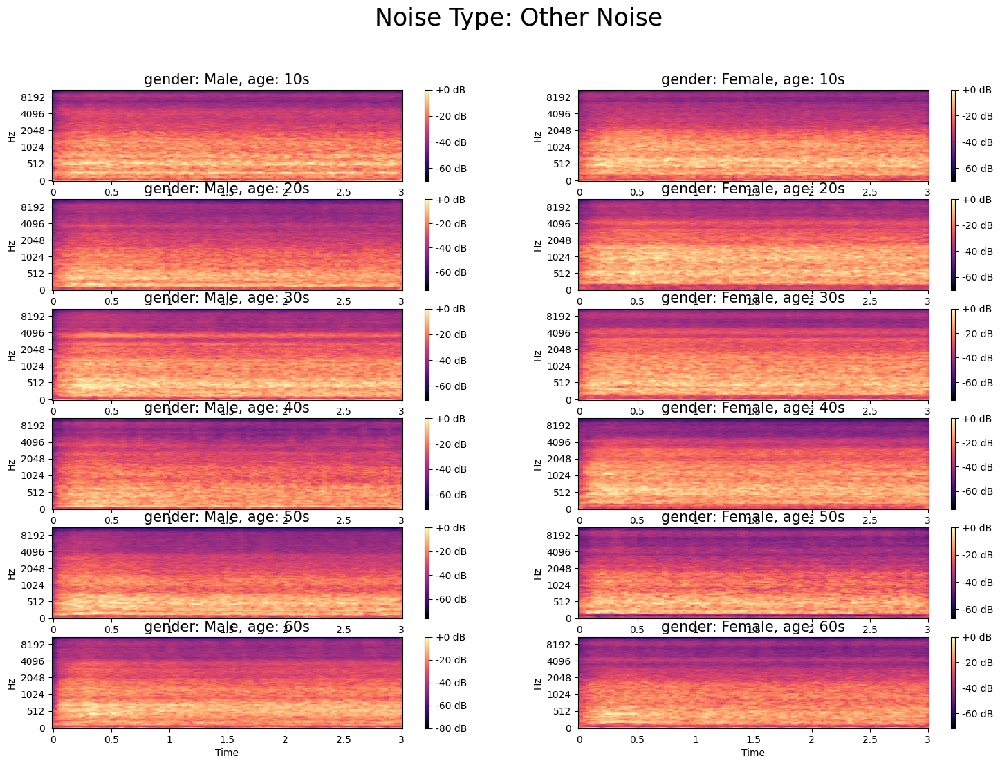

In [ ]:
for n in range(len(avg_wavs_3d_list)):
    plt.figure(figsize=(18,12))
    plt.suptitle(f"Noise Type: {noise[n]}",fontsize=25)

    for a in range(len(avg_wavs_3d_list[n])):
        for g in range(len(avg_wavs_3d_list[n][a])):
            avg_wav = avg_wavs_3d_list[n][a][g]
            # None인 경우 처리
            if avg_wav is None:
                continue
            plt.subplot(6,2,a*2+g+1)
            mel_spec = librosa.feature.melspectrogram(y=avg_wav, sr=sr)
            mel_spec = librosa.power_to_db(mel_spec, ref=np.max)
            librosa.display.specshow(mel_spec, sr=sr, x_axis='time', y_axis='mel')
            plt.colorbar(format='%+2.0f dB')
            plt.title(f'gender: {gender[g]}, age: {age[a]}',fontsize=15)
    plt.show()

### MFCC

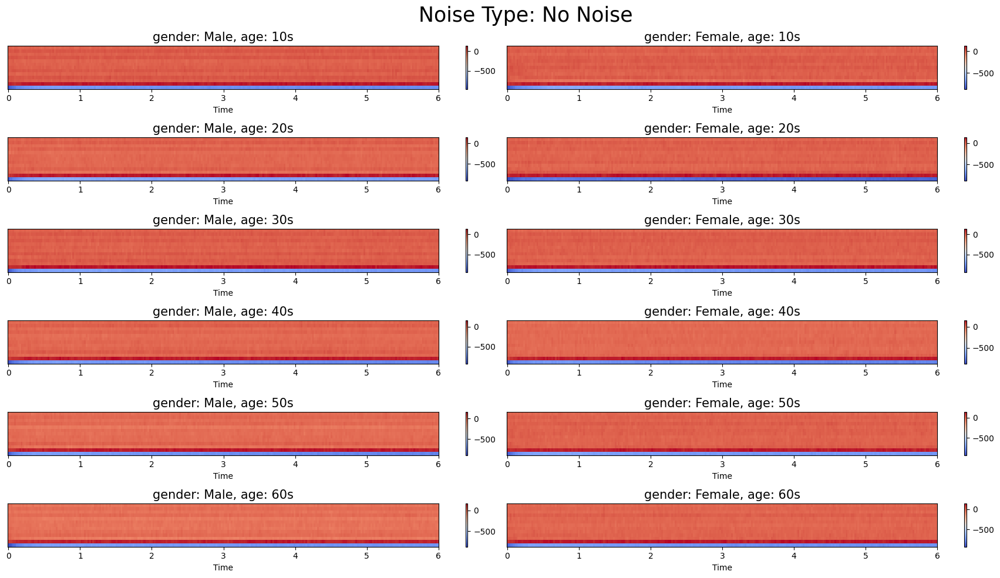

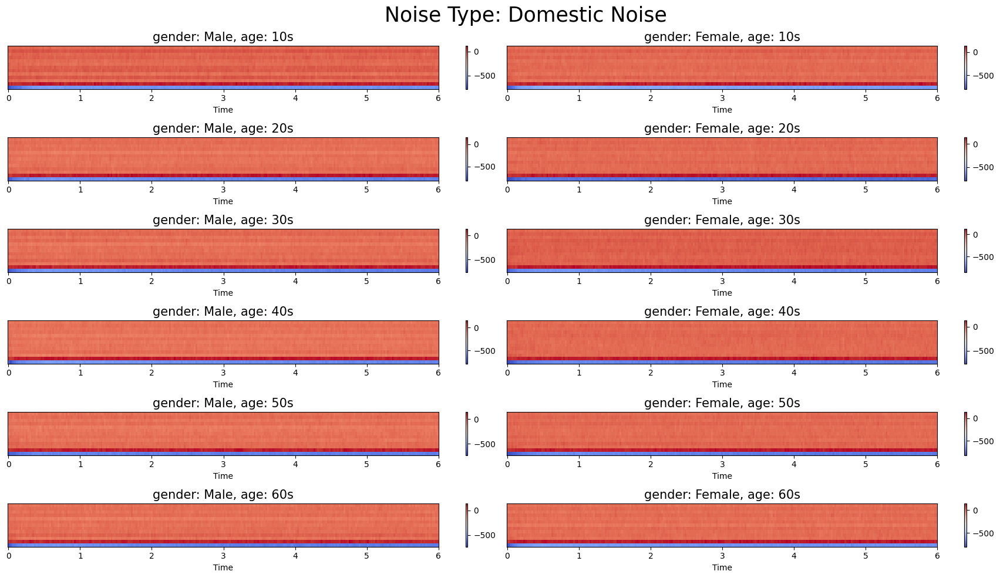

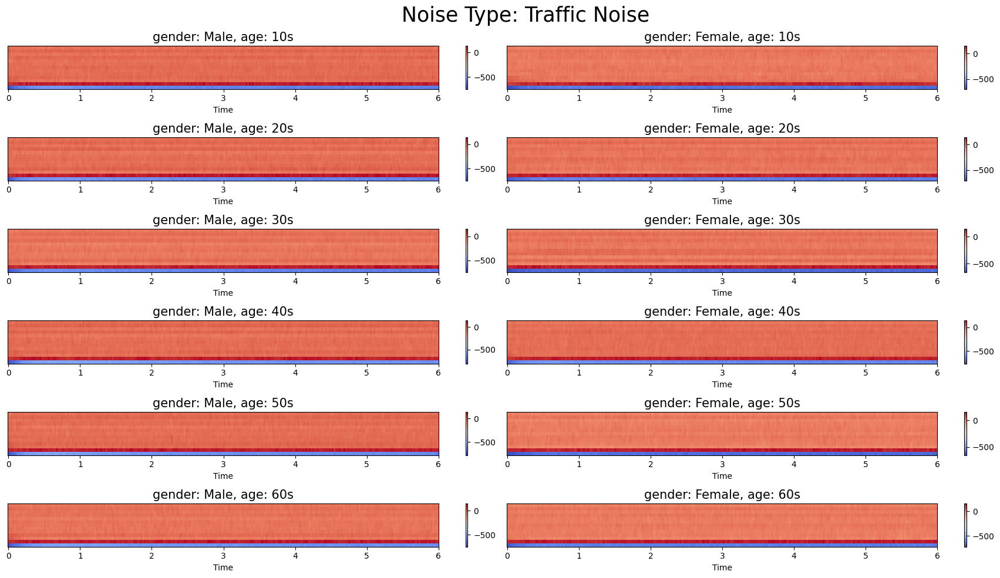

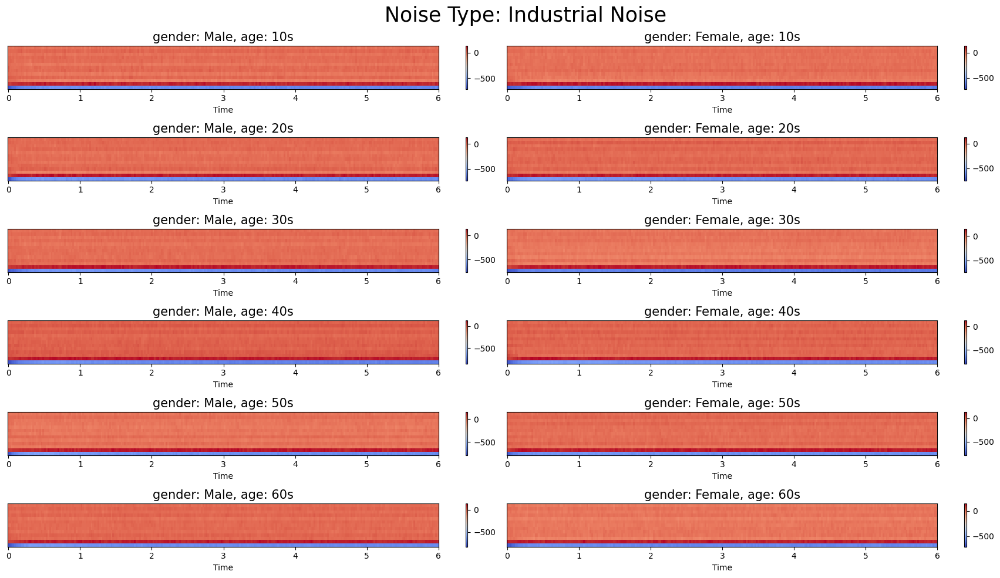

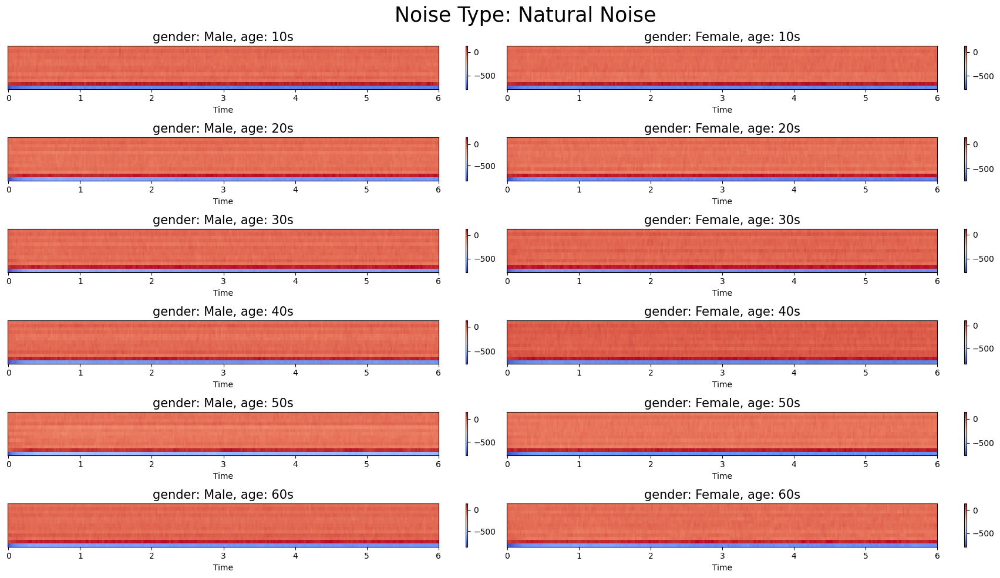

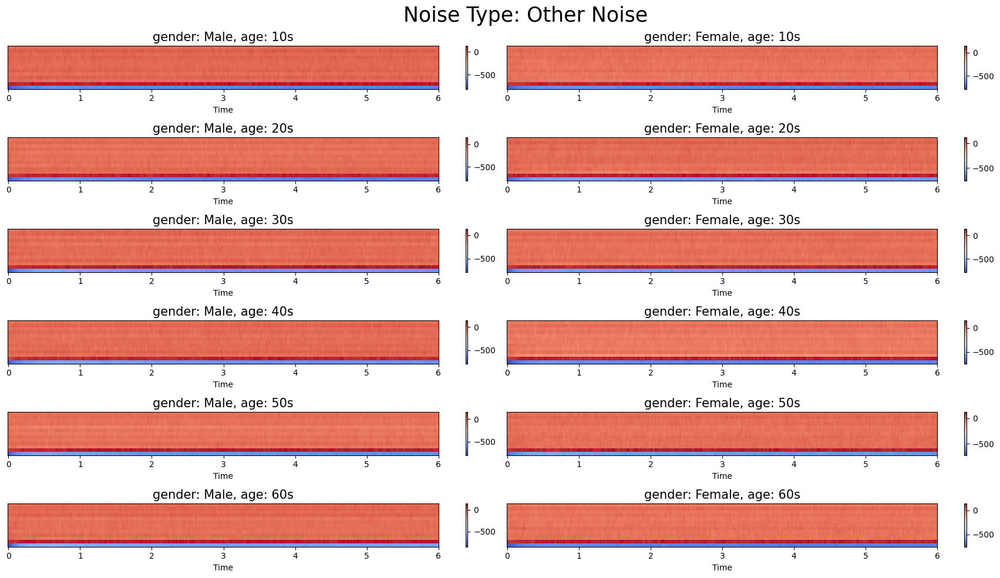

In [ ]:
for n in range(len(avg_wavs_3d_list)):
    plt.figure(figsize=(18,10))
    plt.suptitle(f"Noise Type: {noise[n]}",fontsize=25)

    for a in range(len(avg_wavs_3d_list[n])):
        for g in range(len(avg_wavs_3d_list[n][a])):
            avg_wav = avg_wavs_3d_list[n][a][g]
            # None인 경우 처리
            if avg_wav is None:
                continue
            plt.subplot(6,2,a*2+g+1)
            mfcc = librosa.feature.mfcc(y=avg_wav, sr=sr, n_mfcc=13,n_fft=512,hop_length=256)
            librosa.display.specshow(mfcc, sr=sr, x_axis='time')
            plt.colorbar()
            plt.title('Average MFCC')
            plt.tight_layout()
            plt.savefig('average_mfcc.png')  # 이미지 파일로 저장
            plt.title(f'gender: {gender[g]}, age: {age[a]}',fontsize=15)
    plt.show()

### Harmony (MPSS without Percussive sound)

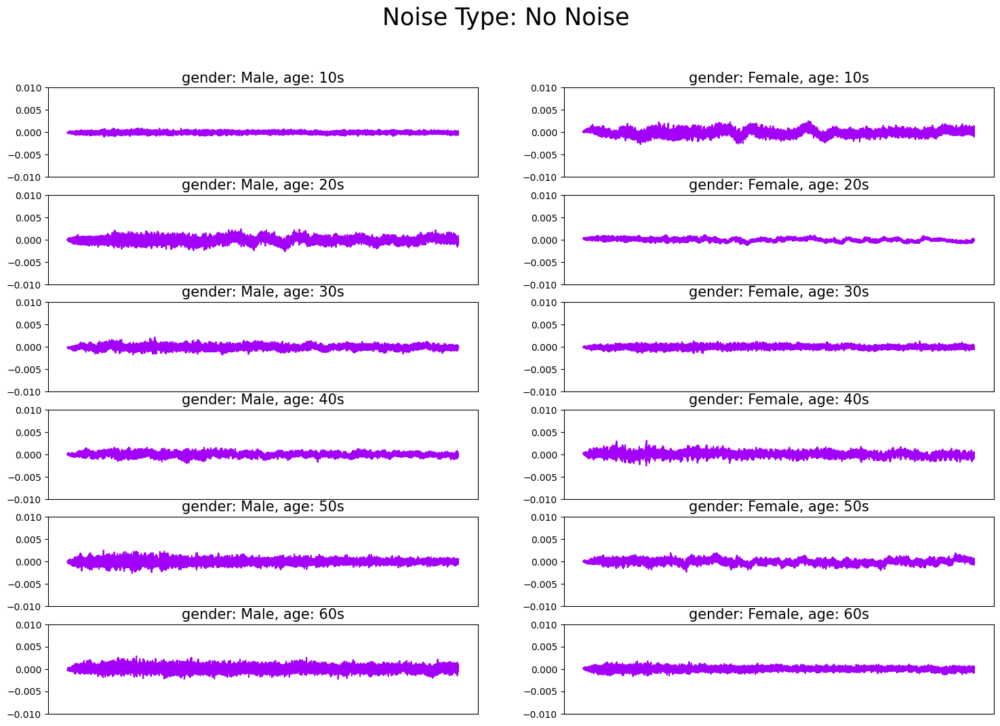

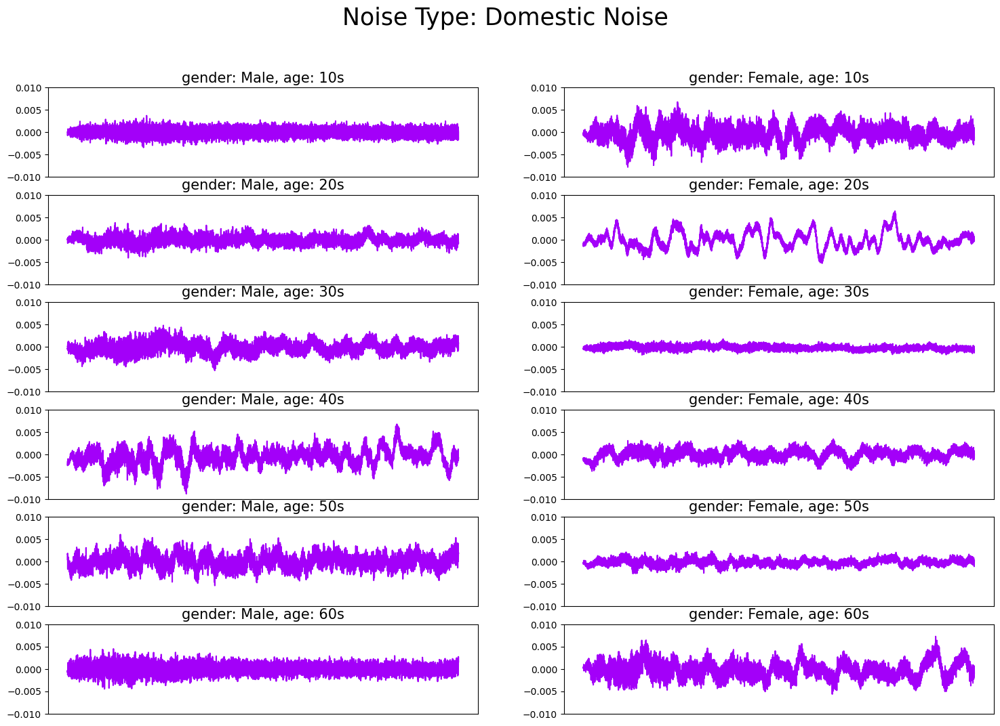

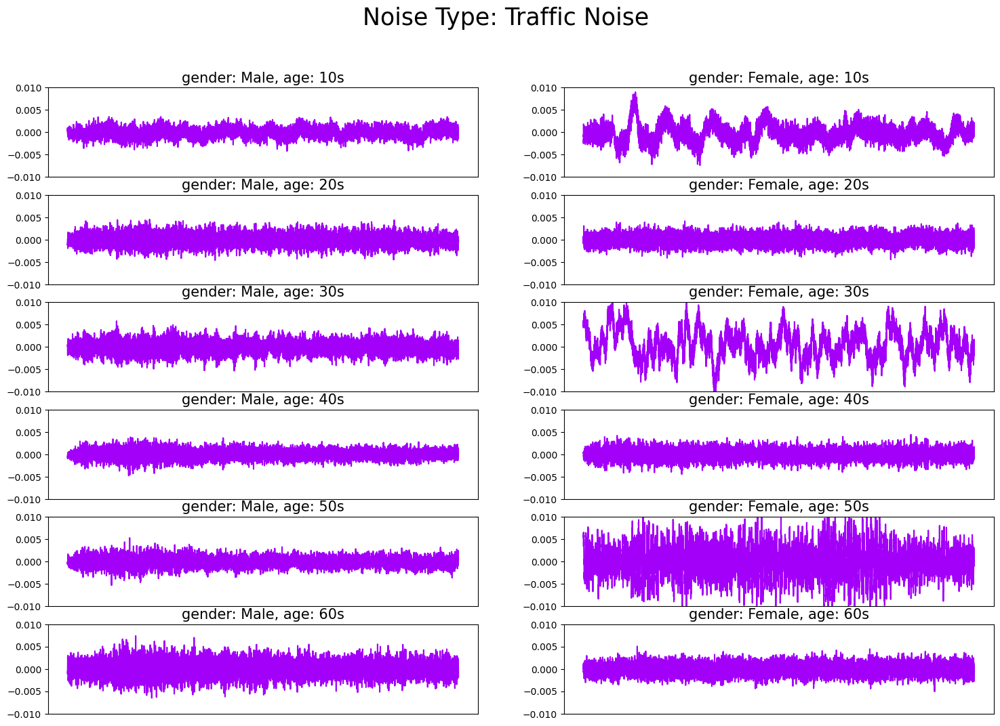

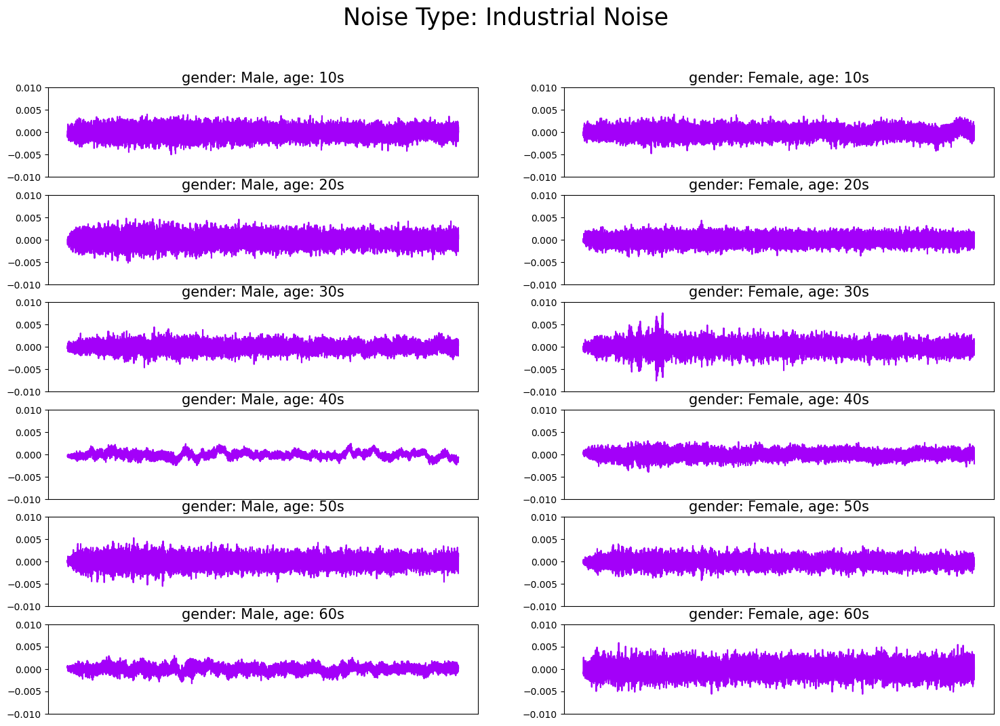

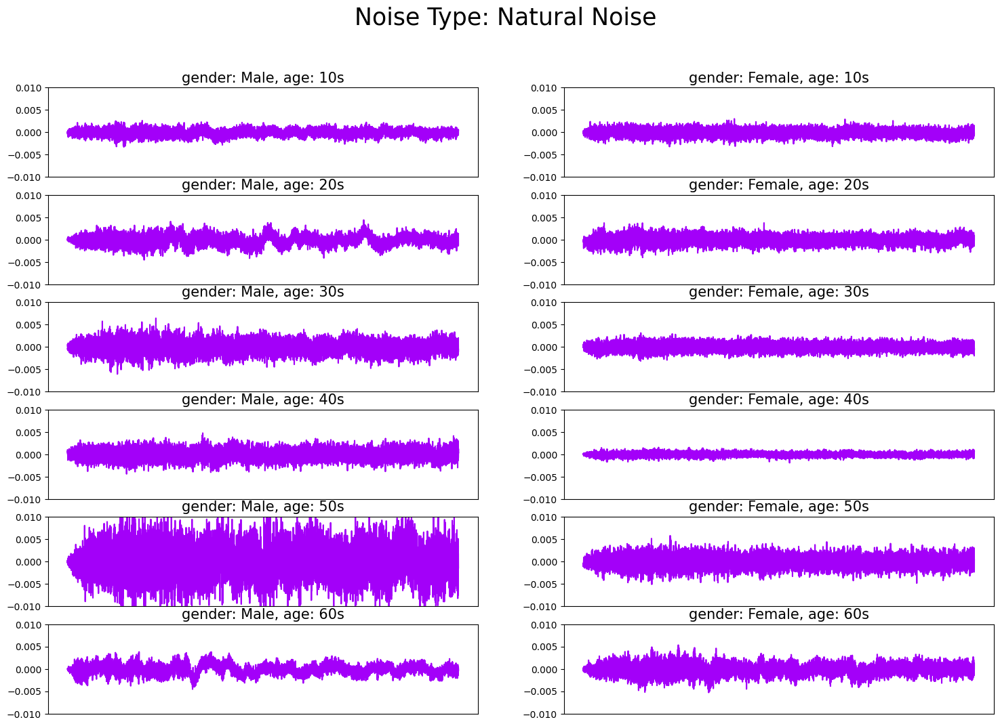

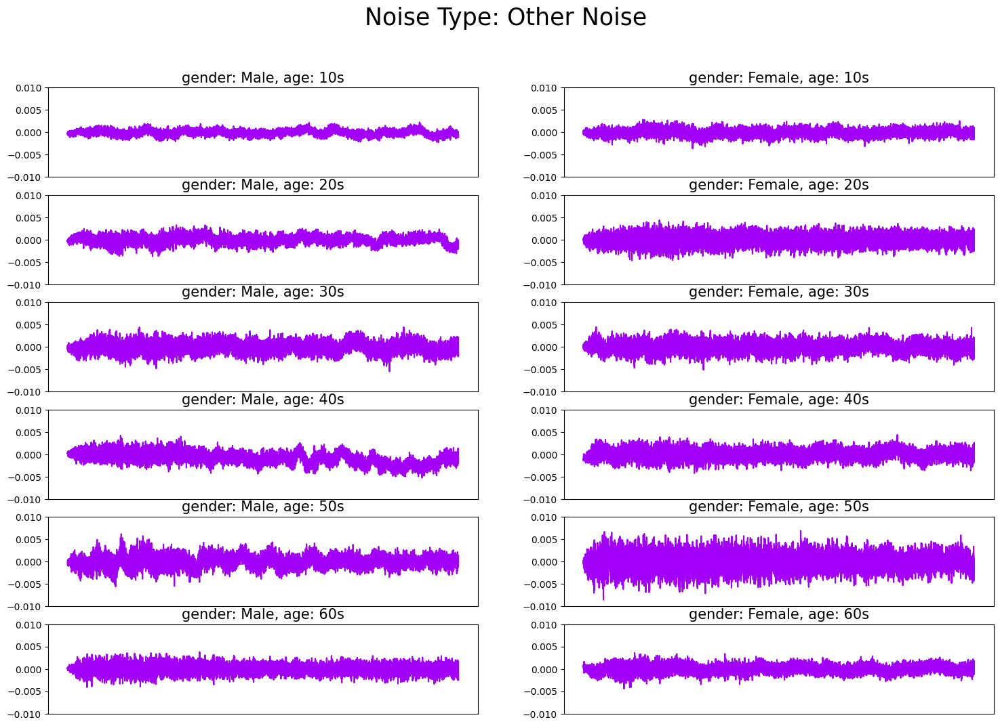

In [ ]:
# avg_wavs_3d_list 순회
for n in range(len(avg_wavs_3d_list)):
    plt.figure(figsize=(18,12))
    plt.suptitle(f"Noise Type: {noise[n]}",fontsize=25)

    for a in range(len(avg_wavs_3d_list[n])):
        for g in range(len(avg_wavs_3d_list[n][a])):
            avg_wav = avg_wavs_3d_list[n][a][g]
            # None인 경우 처리
            if avg_wav is None:
                continue
            plt.subplot(6,2,a*2+g+1)
            y_harm, y_perc = librosa.effects.hpss(avg_wav)
            plt.plot(y_harm, color = '#A300F9')
            # plt.plot(y_perc, color = '#FFB100')
            plt.gca().set_title(f'gender: {gender[g]}, age: {age[a]}',fontsize=15)
            plt.gca().get_xaxis().set_visible(False)
            plt.gca().set_ylim([-0.01, 0.01])  # y축 범위 설정
    plt.show()

### Average Pitch

In [ ]:
def calculate_average_pitch(audio, sr = 22050, fmin=50, fmax=400):
    """
    주어진 오디오 파일의 평균 피치를 계산합니다.
    
    :param audio: 분석할 오디오 파일
    :param sr: 샘플링 레이트 
    :param fmin: 피치 추출을 위한 최소 주파수
    :param fmax: 피치 추출을 위한 최대 주파수
    :return: 평균 피치 (Hz)
    """

    # 피치 추출
    pitches, magnitudes = librosa.piptrack(y=audio, sr=sr, fmin=fmin, fmax=fmax)

    # 유효한 피치 값들만 선택
    pitch_values = pitches[magnitudes > np.median(magnitudes)]

    if len(pitch_values) == 0:
        return 0  # 유효한 피치 값이 없는 경우 0 반환

    # 평균 피치 계산
    average_pitch = np.mean(pitch_values)

    return average_pitch



In [ ]:
# 데이터 프레임에 스타일 적용
def style_df(df):
    return df.style.background_gradient(cmap='viridis').highlight_null('red')

Total_M = []
Total_F = []

# 데이터 프로세싱 및 출력
for n in range(len(avg_wavs_3d_list)):
    df = pd.DataFrame(columns=["Age", "Male" , "Fmale"])
    male_pitch = []
    fmale_pitch = []

    for a in range(len(avg_wavs_3d_list[n])):
        df.loc[a] = [age[a], None, None]
        for g in range(len(avg_wavs_3d_list[n][a])):
            avg_wav = avg_wavs_3d_list[n][a][g]
            if avg_wav is None:
                continue
            y_harm, y_perc = librosa.effects.hpss(avg_wav)
            average_pitch = calculate_average_pitch(y_harm)
            df.iloc[a,g+1] = average_pitch
            if g:
                fmale_pitch.append(average_pitch)
            else:
                male_pitch.append(average_pitch)

    if male_pitch or fmale_pitch:
        male_average = sum(male_pitch) / len(male_pitch)
        fmale_average = sum(fmale_pitch) / len(fmale_pitch)
        df.loc[len(df)] = ["Total", male_average, fmale_average]
        Total_M.append(male_average)
        Total_F.append(fmale_average)
    print(f"Noise Environment:{noise[n]}")
    display(style_df(df))  # 스타일링된 데이터 프레임 출력

print(f'Average_male: {sum(Total_M)/len(Total_M)}')
print(f'Average_female: {sum(Total_F)/len(Total_F)}')
    


Noise Environment:No Noise


,Age,Male,Fmale
0,10s,233.419342,254.106857
1,20s,249.658279,209.340256
2,30s,233.059006,235.837891
3,40s,239.286316,251.806519
4,50s,258.036041,244.475204
5,60s,240.473373,264.667053
6,Total,242.322060,243.372297


Noise Environment:Domestic Noise


,Age,Male,Fmale
0,10s,240.719650,286.289978
1,20s,254.521271,244.914841
2,30s,263.691040,217.086578
3,40s,256.392334,242.432175
4,50s,238.800003,238.683151
5,60s,232.768555,245.453262
6,Total,247.815475,245.809998


Noise Environment:Traffic Noise


,Age,Male,Fmale
0,10s,224.910706,213.044739
1,20s,232.717392,220.679825
2,30s,220.623352,183.171799
3,40s,236.324509,219.891769
4,50s,237.849854,160.656906
5,60s,231.199158,225.263321
6,Total,230.604162,203.784726


Noise Environment:Industrial Noise


,Age,Male,Fmale
0,10s,229.412445,221.155289
1,20s,226.821533,240.328156
2,30s,233.261810,199.084732
3,40s,210.426025,227.513123
4,50s,241.137177,235.556732
5,60s,233.404602,235.072052
6,Total,229.077265,226.451681


Noise Environment:Natural Noise


,Age,Male,Fmale
0,10s,220.658081,236.876251
1,20s,233.055832,242.200165
2,30s,238.877487,261.171173
3,40s,234.003738,247.464218
4,50s,256.434875,274.204590
5,60s,242.380875,253.990311
6,Total,237.568481,252.651118


Noise Environment:Other Noise


,Age,Male,Fmale
0,10s,245.965637,272.832184
1,20s,255.301636,293.167175
2,30s,246.556015,282.187714
3,40s,218.760925,274.633789
4,50s,259.842255,283.310059
5,60s,251.581833,268.025696
6,Total,246.334717,279.026103


Average_male: 238.95369338989258
Average_female: 241.84932030571835


## Image

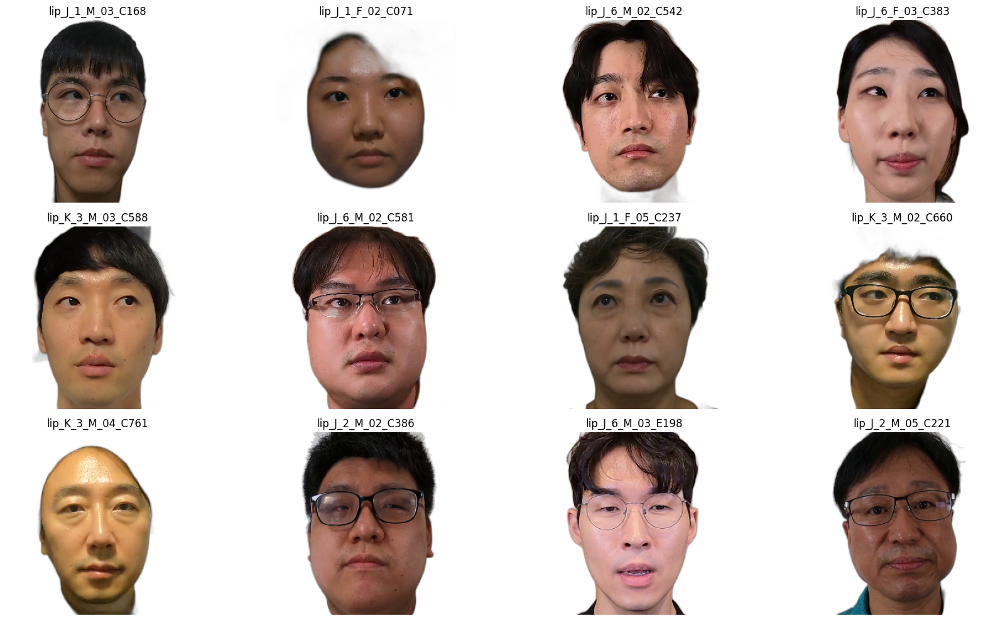

In [ ]:
import os
import random
import matplotlib.pyplot as plt
import matplotlib.image as mpimg


# 각 디렉토리 내의 파일 목록을 가져와 랜덤으로 12개 파일 선택
all_files = []
for folder in folder_list:
    folder_path = os.path.join(root_dir, folder)
    files = [os.path.join(folder_path, file) for file in os.listdir(folder_path) if os.path.isfile(os.path.join(folder_path, file))]
    all_files.extend(files)

# 파일을 랜덤하게 12개 선택
random_files = random.sample(all_files, 12)

# 3x4 형태로 플롯 설정
fig, axes = plt.subplots(3, 4, figsize=(18, 10))
axes = axes.ravel()  # 2D 배열을 1D로 변환

for i in range(12):
    img = mpimg.imread(random_files[i])
    axes[i].imshow(img)
    axes[i].set_title(f'{os.path.basename(random_files[i]).split(".")[0]}')
    axes[i].axis('off')  # 축 제거

plt.tight_layout()
plt.show()
